**TO DO**

1. Prep the Yolo for multiple training. one with old data, one with new.
1. Need losses for differenttraining parameters
1. 256/ 32, 512, 8, 1024 * 4, 2

In [1]:
import time
from matplotlib import pyplot as plt
import numpy as np
import mxnet as mx
from mxnet import autograd, gluon
import gluoncv as gcv
from gluoncv.utils import download, viz
import os

In [2]:
train_data = gcv.data.RecordFileDetection('./Deep-Waldo/data/train.rec')
valid_data = gcv.data.RecordFileDetection('./Deep-Waldo/data/valid.rec')
classes = ['Waldo']  # only one foreground class here

idx = np.random.randint(len(train_data))
image, labels = train_data[idx]
print('boxes:', labels)

boxes: [[ 379.  564.  395.  579.    0.]]


In [3]:
from mxnet.gluon.data import DataLoader
from gluoncv.data.transforms import presets

def get_dataloader(net, train_dataset, data_shape, batch_size, num_workers):
    from gluoncv.data.batchify import Tuple, Stack, Pad
    from gluoncv.data.transforms.presets.yolo import YOLO3DefaultTrainTransform
    width, height = data_shape, data_shape
    # use fake data to generate fixed anchors for target generation
    with autograd.train_mode():
        batchify_fn = Tuple(*([Stack() for _ in range(6)] + [Pad(axis=0, pad_val=-1) for _ in range(1)]))
        train_transform = presets.yolo.YOLO3DefaultTrainTransform(width, height, net)
        train_loader = DataLoader(train_dataset.transform(train_transform), batch_size, shuffle=True,
                          batchify_fn=batchify_fn, last_batch='rollover', num_workers=num_workers)
    return train_loader


try:
    ctx = [mx.gpu(0)]
    print('gpu is a success')
except:
    print('Cpu')
    ctx = [mx.cpu()]

gpu is a success


# Model LR: .01, EPOCH: 300, 512/4

In [ ]:
net = gcv.model_zoo.get_model('yolo3_darknet53_voc', pretrained=True)
net.reset_class(classes)
net.collect_params().initialize(force_reinit=True, ctx=ctx)
# net.collect_params()
# .reset_ctx(ctx)

batch_size = 4
train = get_dataloader(net, train_data, 512, batch_size, 0) # look into modifying this because what is our data sahpe?

trainer = gluon.Trainer(
    net.collect_params(), 'adam',
    {'learning_rate': 0.001, 'wd': 0.0005})

mbox_loss = gcv.loss.YOLOV3Loss()
ce_metric = mx.metric.Loss('CrossEntropy')
smoothl1_metric = mx.metric.Loss('SmoothL1')

In [ ]:
num_epochs = 300

loss = {}
loss['scale_loss'] = []
loss['obs_loss'] = []
loss['center_loss'] = []
loss['cls_loss'] = []
loss['total'] = []

for epoch in range(num_epochs):
  
    ce_metric.reset() 
    smoothl1_metric.reset()
    tic = time.time()
    btic = time.time()
#     net.hybridize(static_alloc=True, static_shape=True) # look this up if you wan tot know more https://mxnet.incubator.apache.org/api/python/gluon/gluon.html?highlight=hybridize#mxnet.gluon.Block.hybridize
    for i, batch in enumerate(train):
        batch_size = batch[0].shape[0]
        data = gluon.utils.split_and_load(batch[0], ctx_list=ctx, batch_axis=0)
        cls_targets = gluon.utils.split_and_load(batch[1], ctx_list=ctx, batch_axis=0)
        box_targets = gluon.utils.split_and_load(batch[2], ctx_list=ctx, batch_axis=0)
        input_order = [0, 6, 1, 2, 3, 4, 5]

        with autograd.record():
            obj_loss, center_loss, scale_loss, cls_loss = net(*[batch[o].as_in_context(ctx[0]) for o in input_order])
            
            sum_loss = obj_loss + center_loss + scale_loss + cls_loss
            
            total_loss = sum_loss[0].asscalar() +  sum_loss[1].asscalar() +  sum_loss[2].asscalar() + sum_loss[3].asscalar()

            autograd.backward(obj_loss)
        
        trainer.step(batch_size)
        
        print('[Epoch {}][Batch {}], Speed: {:.3f} samples/sec, Obs Loss={:.3f}, Center Loss={:.3f}, Scale Loss={:.3f}, Cls Loss={:.3f}'.format(
            epoch, i, batch_size/(time.time()-btic), sum_loss[0].asscalar(), sum_loss[1].asscalar(), sum_loss[2].asscalar(), sum_loss[3].asscalar()))
        
        btic = time.time()
        
    if not os.path.isdir('./model'):
        os.mkdir('./model')
        
    # loss appending. Last loss per epoch 
    loss['obs_loss'].append(sum_loss[0].asscalar())
    loss['center_loss'].append(sum_loss[1].asscalar())
    loss['scale_loss'].append(sum_loss[2].asscalar())
    loss['cls_loss'].append(sum_loss[3].asscalar())
      
    net.save_parameters('./model/original_yolo_512_4_obj_loss.params')
    
    print('Model Saved at Epoch {0}'.format(epoch))

In [ ]:
x = list(range(num_epochs))

plt.figure(figsize=(10,8))

plt.plot(x, loss['obs_loss'],label='Obs')
plt.plot(x, loss['center_loss'],label='Center')
plt.plot(x, loss['scale_loss'],label='Scale')
plt.plot(x, loss['cls_loss'],label='CLS')

plt.title('Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.ylim()

plt.savefig('graphs/yolo_512_4.png')

In [ ]:
net = gcv.model_zoo.get_model('yolo3_darknet53_voc', pretrained=True)
net.reset_class(classes)
net.load_parameters('./model/original_yolo_512_4.params')

x, image = gcv.data.transforms.presets.yolo.load_test('./Deep-Waldo/data/original/12.jpg')
cid, score, bbox = net(x)
fig = plt.figure(figsize=(22,20))
ax = fig.add_subplot(1, 1, 1)
# bbox = bbox[:, :4]
# cid = cid[:, 4:5]
# viz.plot_bbox(image, bbox, labels=cid, class_names=classes, ax=ax)
viz.plot_bbox(image, bbox, score, cid, class_names=classes, ax=ax)
plt.show()

# Model LR: .01, EPOCH: 100, 1024,4

In [4]:
net = gcv.model_zoo.get_model('yolo3_darknet53_voc', pretrained=True)
net.reset_class(classes)
net.collect_params().initialize(force_reinit=True, ctx=ctx)
# net.collect_params()
# .reset_ctx(ctx)

batch_size = 4
train = get_dataloader(net, train_data, 1024, batch_size, 0) # look into modifying this because what is our data sahpe?

trainer = gluon.Trainer(
    net.collect_params(), 'adam',
    {'learning_rate': 0.001, 'wd': 0.0005})

mbox_loss = gcv.loss.YOLOV3Loss()
ce_metric = mx.metric.Loss('CrossEntropy')
smoothl1_metric = mx.metric.Loss('SmoothL1')

In [5]:
try:
    net.load_parameters('./model/yolo_waldo.params')
    print('Model Loaded')
except:
      pass

num_epochs = 100

loss = {}
loss['scale_loss'] = []
loss['obs_loss'] = []
loss['center_loss'] = []
loss['cls_loss'] = []
loss['total'] = []

for epoch in range(num_epochs):
  
    ce_metric.reset() 
    smoothl1_metric.reset()
    tic = time.time()
    btic = time.time()
#     net.hybridize(static_alloc=True, static_shape=True) # look this up if you wan tot know more https://mxnet.incubator.apache.org/api/python/gluon/gluon.html?highlight=hybridize#mxnet.gluon.Block.hybridize
    for i, batch in enumerate(train):
        batch_size = batch[0].shape[0]
        data = gluon.utils.split_and_load(batch[0], ctx_list=ctx, batch_axis=0)
        cls_targets = gluon.utils.split_and_load(batch[1], ctx_list=ctx, batch_axis=0)
        box_targets = gluon.utils.split_and_load(batch[2], ctx_list=ctx, batch_axis=0)
        input_order = [0, 6, 1, 2, 3, 4, 5]

        with autograd.record():
            obj_loss, center_loss, scale_loss, cls_loss = net(*[batch[o].as_in_context(ctx[0]) for o in input_order])
            
            sum_loss = obj_loss + center_loss + scale_loss + cls_loss
            
            total_loss = sum_loss[0].asscalar() +  sum_loss[1].asscalar() +  sum_loss[2].asscalar() + sum_loss[3].asscalar()

            autograd.backward(sum_loss)
        
        trainer.step(batch_size)
        
        print('[Epoch {}][Batch {}], Speed: {:.3f} samples/sec, Obs Loss={:.3f}, Center Loss={:.3f}, Scale Loss={:.3f}, Cls Loss={:.3f}'.format(
            epoch, i, batch_size/(time.time()-btic), sum_loss[0].asscalar(), sum_loss[1].asscalar(), sum_loss[2].asscalar(), sum_loss[3].asscalar()))
        
        btic = time.time()
        
    if not os.path.isdir('./model'):
        os.mkdir('./model')
        
    # loss appending. Last loss per epoch 
    loss['obs_loss'].append(sum_loss[0].asscalar())
    loss['center_loss'].append(sum_loss[1].asscalar())
    loss['scale_loss'].append(sum_loss[2].asscalar())
    loss['cls_loss'].append(sum_loss[3].asscalar())
    
      
    net.save_parameters('./model/yolo_1024_4.params')
    
    print('Model Saved at Epoch {0}'.format(epoch))

[Epoch 0][Batch 0], Speed: 0.332 samples/sec, Obs Loss=49298.051, Center Loss=45416.523, Scale Loss=47847.258, Cls Loss=47323.453
[Epoch 0][Batch 1], Speed: 0.920 samples/sec, Obs Loss=40968.793, Center Loss=61291.625, Scale Loss=40972.238, Cls Loss=46706.555
[Epoch 0][Batch 2], Speed: 4.261 samples/sec, Obs Loss=36759.086, Center Loss=40805.492, Scale Loss=37225.160, Cls Loss=37768.387
[Epoch 0][Batch 3], Speed: 2.679 samples/sec, Obs Loss=35484.688, Center Loss=36192.398, Scale Loss=32333.773, Cls Loss=28416.750
[Epoch 0][Batch 4], Speed: 0.889 samples/sec, Obs Loss=30116.674, Center Loss=26755.209, Scale Loss=25228.273, Cls Loss=30120.842
[Epoch 0][Batch 5], Speed: 1.072 samples/sec, Obs Loss=24147.322, Center Loss=21563.475, Scale Loss=21323.348, Cls Loss=21267.273
[Epoch 0][Batch 6], Speed: 4.410 samples/sec, Obs Loss=22969.441, Center Loss=22622.117, Scale Loss=18873.186, Cls Loss=19359.416
Model Saved at Epoch 0
[Epoch 1][Batch 0], Speed: 2.259 samples/sec, Obs Loss=16170.075, C

In [6]:
net.save_parameters('./model/yolo_1024_4.params')

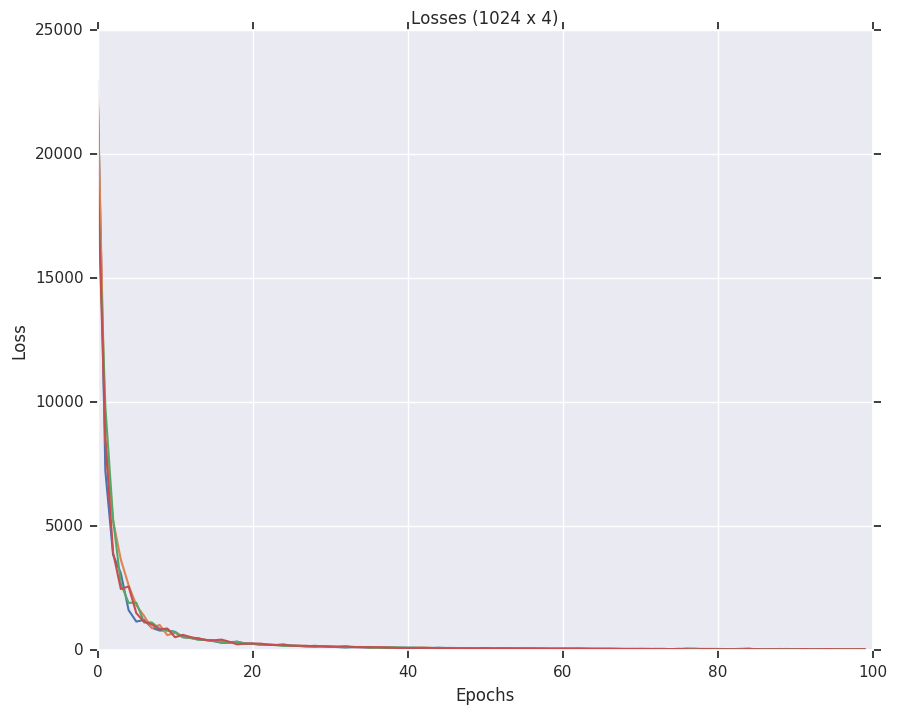

In [16]:
x = list(range(num_epochs))

plt.figure(figsize=(10,8))

plt.plot(x, loss['obs_loss'],label='Obs')
plt.plot(x, loss['center_loss'],label='Center')
plt.plot(x, loss['scale_loss'],label='Scale')
plt.plot(x, loss['cls_loss'],label='CLS')

plt.title('Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()
plt.savefig('graphs/yolo_1024_4.png')

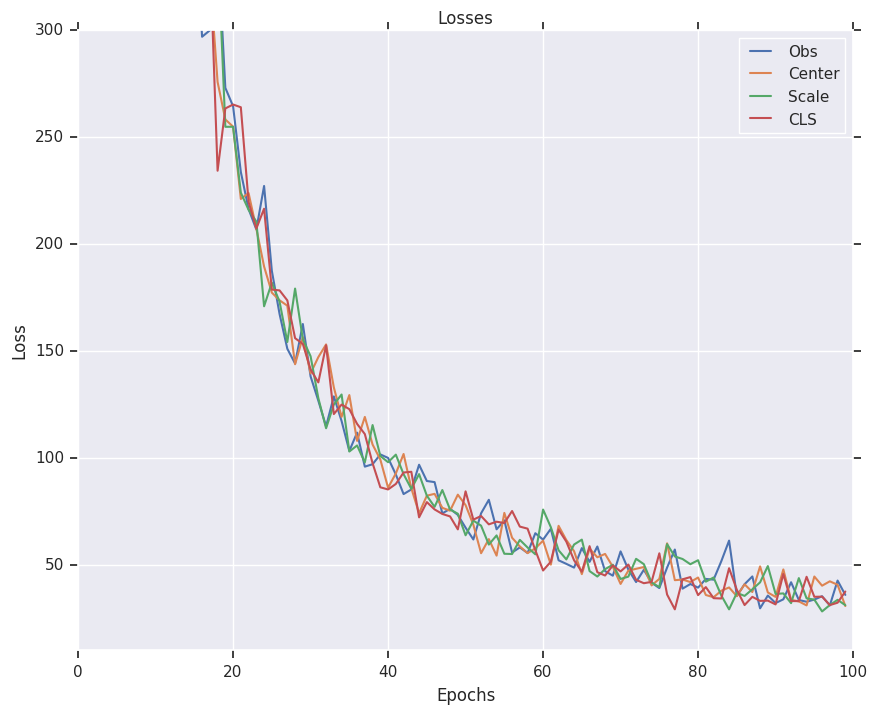

In [13]:
import seaborn as sns
plt.figure(figsize=(10,8))
sns.set()

sns.lineplot(data =np.array(loss['obs_loss']),label='Obs')
sns.lineplot(data=np.array(loss['center_loss']),label='Center')
sns.lineplot(data=np.array(loss['scale_loss']),label='Scale')
sns.lineplot(data=np.array(loss['cls_loss']),label='CLS')

plt.legend()
plt.title('Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.ylim(10, 300)
plt.show()

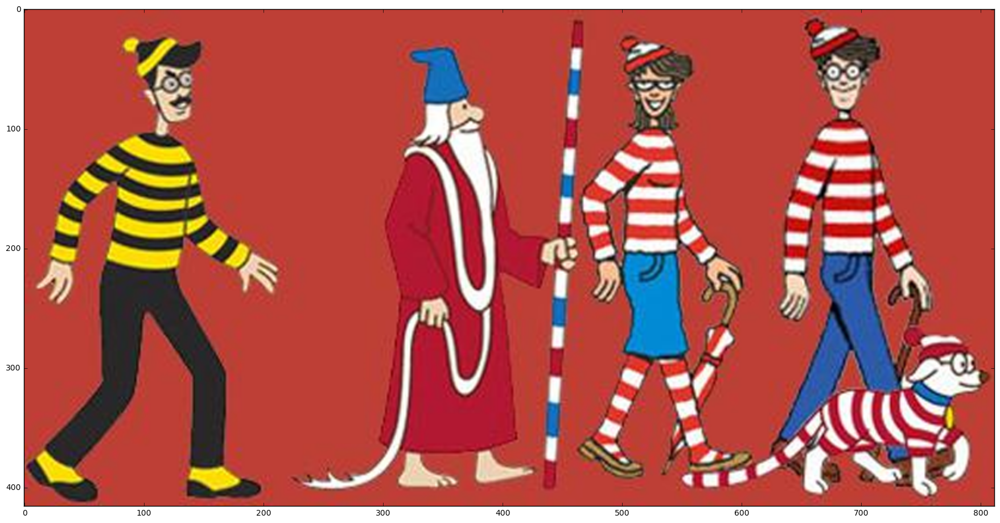

In [12]:
net = gcv.model_zoo.get_model('yolo3_darknet53_voc', pretrained=True)
net.reset_class(classes)
net.load_parameters('./model/yolo_1024_4.params')

x, image = gcv.data.transforms.presets.yolo.load_test('./Deep-Waldo/data/original/30.jpg')
cid, score, bbox = net(x)
fig = plt.figure(figsize=(22,20))
ax = fig.add_subplot(1, 1, 1)
# bbox = bbox[:, :4]
# cid = cid[:, 4:5]
# viz.plot_bbox(image, bbox, labels=cid, class_names=classes, ax=ax)
viz.plot_bbox(image, bbox, score, cid, class_names=classes, ax=ax)
plt.show()

# Model LR: .001, EPOCH: 100, 128/32

In [9]:
net = gcv.model_zoo.get_model('yolo3_darknet53_voc', pretrained=True)
net.reset_class(classes)
# net.collect_params()
# .reset_ctx(ctx)

batch_size = 32
train = get_dataloader(net, train_data, 128, batch_size, 0) # look into modifying this because what is our data sahpe?

trainer = gluon.Trainer(
    net.collect_params(), 'adam',
    {'learning_rate': 0.001, 'wd': 0.0005})

mbox_loss = gcv.loss.YOLOV3Loss()
ce_metric = mx.metric.Loss('CrossEntropy')
smoothl1_metric = mx.metric.Loss('SmoothL1')

In [10]:
try:
    net.load_parameters('./model/yolo_waldo.params')
    print('Model Loaded')
except:
      pass

num_epochs = 100

loss = {}
loss['scale_loss'] = []
loss['obs_loss'] = []
loss['center_loss'] = []
loss['cls_loss'] = []


for epoch in range(num_epochs):
  
    ce_metric.reset() 
    smoothl1_metric.reset()
    tic = time.time()
    btic = time.time()
#     net.hybridize(static_alloc=True, static_shape=True) # look this up if you wan tot know more https://mxnet.incubator.apache.org/api/python/gluon/gluon.html?highlight=hybridize#mxnet.gluon.Block.hybridize
    for i, batch in enumerate(train):
        batch_size = batch[0].shape[0]
        data = gluon.utils.split_and_load(batch[0].as_in_context(ctx[0]), ctx_list=ctx, batch_axis=0)
        cls_targets = gluon.utils.split_and_load(batch[1], ctx_list=ctx, batch_axis=0)
        box_targets = gluon.utils.split_and_load(batch[2], ctx_list=ctx, batch_axis=0)
        input_order = [0, 6, 1, 2, 3, 4, 5]

        with autograd.record():
            obj_loss, center_loss, scale_loss, cls_loss = net(*[batch[o] for o in input_order])
            
            sum_loss = obj_loss + center_loss + scale_loss + cls_loss
            
#             total_loss = sum_loss[0].asscalar() +  sum_loss[1].asscalar() +  sum_loss[2].asscalar() + sum_loss[3].asscalar()

            autograd.backward(sum_loss)
        
        trainer.step(batch_size)
        
        print('[Epoch {}][Batch {}], Speed: {:.3f} samples/sec, Obs Loss={:.3f}, Center Loss={:.3f}, Scale Loss={:.3f}, Cls Loss={:.3f}'.format(
            epoch, i, batch_size/(time.time()-btic), sum_loss[0].asscalar(), sum_loss[1].asscalar(), sum_loss[2].asscalar(), sum_loss[3].asscalar()))
        
        btic = time.time()
        
    if not os.path.isdir('./model'):
        os.mkdir('./model')
        
    # loss appending. Last loss per epoch 
    loss['obs_loss'].append(sum_loss[0].asscalar())
    loss['center_loss'].append(sum_loss[1].asscalar())
    loss['scale_loss'].append(sum_loss[2].asscalar())
    loss['cls_loss'].append(sum_loss[3].asscalar())
    

    net.save_parameters('./model/yolo_128_32.params')
    
    print('Model Saved at Epoch {0}'.format(epoch))

Model Saved at Epoch 0
[Epoch 1][Batch 0], Speed: 2.822 samples/sec, Obs Loss=773.957, Center Loss=749.522, Scale Loss=829.276, Cls Loss=745.769
Model Saved at Epoch 1
[Epoch 2][Batch 0], Speed: 1.732 samples/sec, Obs Loss=743.998, Center Loss=721.160, Scale Loss=776.991, Cls Loss=741.259
Model Saved at Epoch 2
[Epoch 3][Batch 0], Speed: 2.837 samples/sec, Obs Loss=658.838, Center Loss=681.869, Scale Loss=703.468, Cls Loss=605.394
Model Saved at Epoch 3
[Epoch 4][Batch 0], Speed: 3.418 samples/sec, Obs Loss=488.744, Center Loss=563.809, Scale Loss=545.373, Cls Loss=498.407
Model Saved at Epoch 4
[Epoch 5][Batch 0], Speed: 1.586 samples/sec, Obs Loss=456.377, Center Loss=466.697, Scale Loss=453.120, Cls Loss=513.989
Model Saved at Epoch 5
[Epoch 6][Batch 0], Speed: 3.591 samples/sec, Obs Loss=379.090, Center Loss=379.228, Scale Loss=385.196, Cls Loss=370.942
Model Saved at Epoch 6
[Epoch 7][Batch 0], Speed: 3.103 samples/sec, Obs Loss=319.882, Center Loss=375.734, Scale Loss=320.624, Cl

In [ ]:
import pickle
import seaborn as sns
with open('model/losses/yolo_128_32.pkl;', 'wb') as f:
    pickle.dump(loss, f)

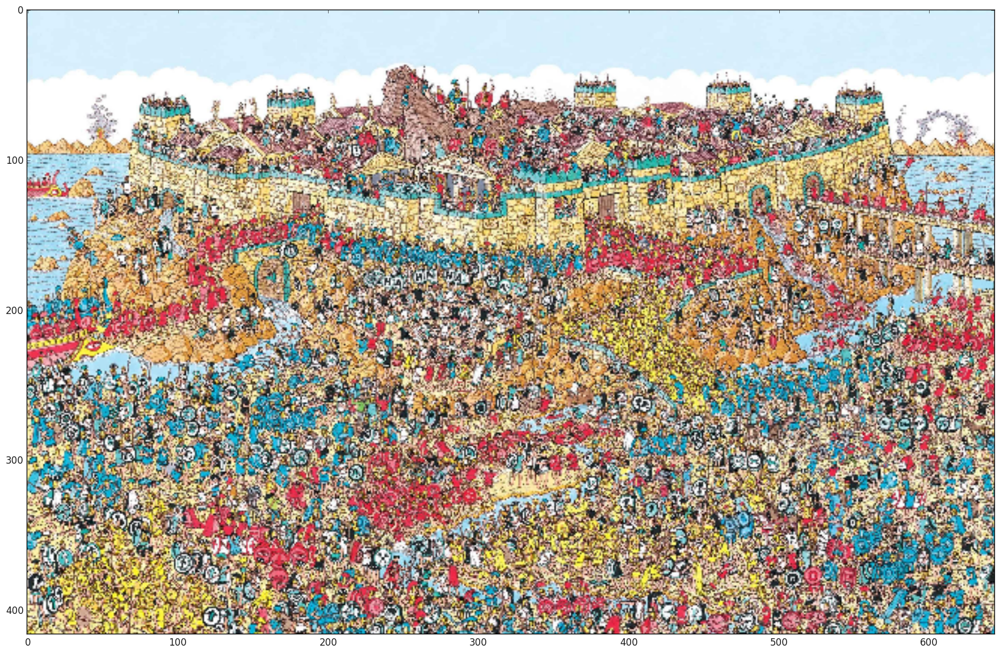

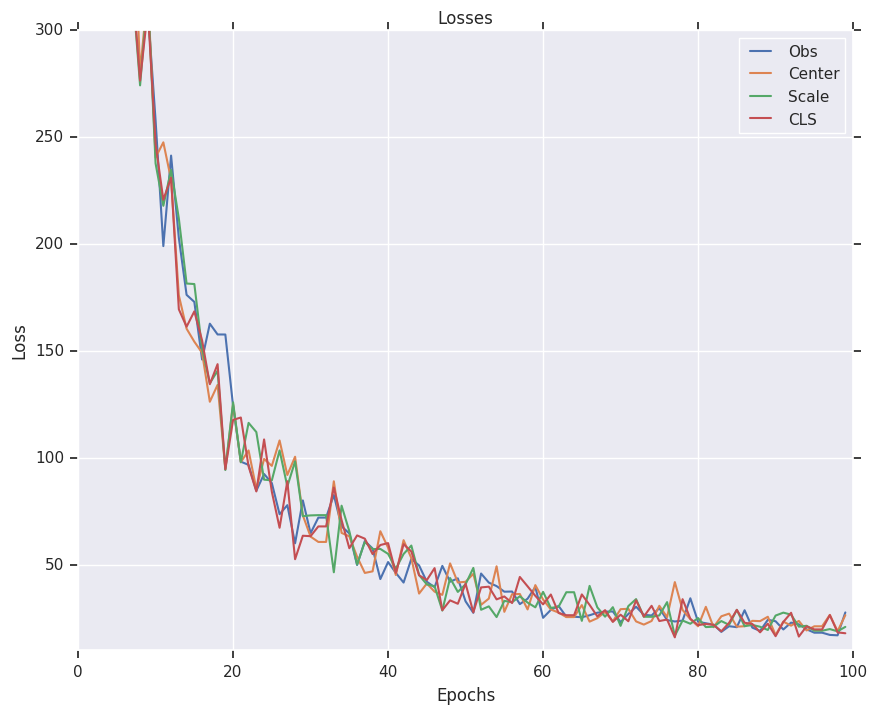

In [11]:
x = list(range(num_epochs))
import seaborn as sns
plt.figure(figsize=(10,8))
sns.set()

sns.lineplot(data =np.array(loss['obs_loss']),label='Obs')
sns.lineplot(data=np.array(loss['center_loss']),label='Center')
sns.lineplot(data=np.array(loss['scale_loss']),label='Scale')
sns.lineplot(data=np.array(loss['cls_loss']),label='CLS')

plt.legend()
plt.title('Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.ylim(10, 300)
plt.show()

plt.savefig('graphs/yolo_128_32.png')

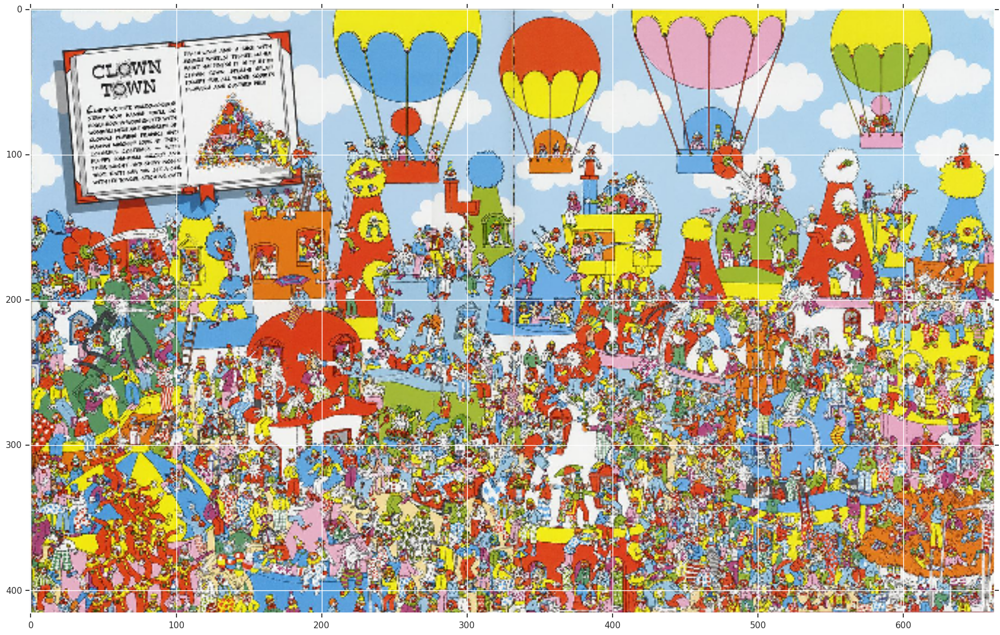

In [12]:
net = gcv.model_zoo.get_model('yolo3_darknet53_voc', pretrained=True)
net.reset_class(classes)
net.load_parameters('./model/yolo_128_32.params')

x, image = gcv.data.transforms.presets.yolo.load_test('./Deep-Waldo/data/original/25.jpg')
cid, score, bbox = net(x)
fig = plt.figure(figsize=(22,20))
ax = fig.add_subplot(1, 1, 1)
# bbox = bbox[:, :4]
# cid = cid[:, 4:5]
# viz.plot_bbox(image, bbox, labels=cid, class_names=classes, ax=ax)
viz.plot_bbox(image, bbox, score, cid, class_names=classes, ax=ax)
plt.show()

# Model LR: .01, EPOCH: 1536, 4

In [ ]:
net = gcv.model_zoo.get_model('yolo3_darknet53_voc', pretrained=True)
net.reset_class(classes)
# net.collect_params()
# .reset_ctx(ctx)

batch_size = 4
train = get_dataloader(net, train_data, 1536, batch_size, 0) # look into modifying this because what is our data sahpe?

trainer = gluon.Trainer(
    net.collect_params(), 'adam',
    {'learning_rate': 0.001, 'wd': 0.0005})

mbox_loss = gcv.loss.YOLOV3Loss()
ce_metric = mx.metric.Loss('CrossEntropy')
smoothl1_metric = mx.metric.Loss('SmoothL1')

In [ ]:
try:
    net.load_parameters('./model/yolo_waldo.params')
    print('Model Loaded')
except:
      pass

num_epochs = 100

loss = {}
loss['scale_loss'] = []
loss['obs_loss'] = []
loss['center_loss'] = []
loss['cls_loss'] = []
loss['total'] = []

for epoch in range(num_epochs):
  
    ce_metric.reset() 
    smoothl1_metric.reset()
    tic = time.time()
    btic = time.time()
#     net.hybridize(static_alloc=True, static_shape=True) # look this up if you wan tot know more https://mxnet.incubator.apache.org/api/python/gluon/gluon.html?highlight=hybridize#mxnet.gluon.Block.hybridize
    for i, batch in enumerate(train):
        batch_size = batch[0].shape[0]
        data = gluon.utils.split_and_load(batch[0], ctx_list=ctx, batch_axis=0)
        cls_targets = gluon.utils.split_and_load(batch[1], ctx_list=ctx, batch_axis=0)
        box_targets = gluon.utils.split_and_load(batch[2], ctx_list=ctx, batch_axis=0)
        input_order = [0, 6, 1, 2, 3, 4, 5]

        with autograd.record():
            obj_loss, center_loss, scale_loss, cls_loss = net(*[batch[o] for o in input_order])
            
            sum_loss = obj_loss + center_loss + scale_loss + cls_loss
            
            total_loss = sum_loss[0].asscalar() +  sum_loss[1].asscalar() +  sum_loss[2].asscalar() + sum_loss[3].asscalar()

            autograd.backward(sum_loss)
        
        trainer.step(batch_size)
        
        print('[Epoch {}][Batch {}], Speed: {:.3f} samples/sec, Obs Loss={:.3f}, Center Loss={:.3f}, Scale Loss={:.3f}, Cls Loss={:.3f}'.format(
            epoch, i, batch_size/(time.time()-btic), sum_loss[0].asscalar(), sum_loss[1].asscalar(), sum_loss[2].asscalar(), sum_loss[3].asscalar()))
        
        btic = time.time()
        
    if not os.path.isdir('./model'):
        os.mkdir('./model')
        
    # loss appending. Last loss per epoch 
    loss['obs_loss'].append(sum_loss[0].asscalar())
    loss['center_loss'].append(sum_loss[1].asscalar())
    loss['scale_loss'].append(sum_loss[2].asscalar())
    loss['cls_loss'].append(sum_loss[3].asscalar())
    
    loss['total_loss'].append(total_loss)
      
    net.save_parameters('./model/yolo_1536_4.params')
    
    print('Model Saved at Epoch {0}'.format(epoch))

In [ ]:
x = list(range(num_epochs))

plt.figure(figsize=(10,8))

plt.plot(x, loss['obs'],label='Obs')
plt.plot(x, loss['center_loss'],label='Center')
plt.plot(x, loss['scale_loss'],label='Scale')
plt.plot(x, loss['cls_loss'],label='CLS')
plt.plot(x, loss['total_loss'],label='Total')

plt.title('Losses')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.savefig('graphs/yolo_1536_4.png')

In [ ]:
net = gcv.model_zoo.get_model('yolo3_darknet53_voc', pretrained=True)
net.reset_class(classes)
net.load_parameters('./model/yolo_1536_4.params')

x, image = gcv.data.transforms.presets.yolo.load_test('./Deep-Waldo/data/original/11.jpg')
cid, score, bbox = net(x)
fig = plt.figure(figsize=(22,20))
ax = fig.add_subplot(1, 1, 1)
# bbox = bbox[:, :4]
# cid = cid[:, 4:5]
# viz.plot_bbox(image, bbox, labels=cid, class_names=classes, ax=ax)
viz.plot_bbox(image, bbox, score, cid, class_names=classes, ax=ax)
plt.show()